In [109]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import pandas as pd
from PIL import Image as pil_image
from bokeh.io import output_notebook
import os

output_notebook()

import amazon_products

data_dir = 'amazon_products_data'
image_dir = os.path.join(data_dir, 'images')
file_name = os.path.join(data_dir, 'amazon_products.csv')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Loading BokehJS ...

In [110]:
df = pd.read_csv(file_name)
df.head(10)

,title,image_file,product_category
0,Bird Watching For Kids - A Special Publication...,1880241196.jpg,Watches
1,NEW Mango Yellow Mix Colorful Jelly Silicone S...,3890968740.jpg,Watches
2,Top Gear Official Merchandise - Top Gear Baseb...,5555014597.jpg,Clothing
3,Blessed By Pope Benedict XVI St Benedict One-d...,7842955883.jpg,Jewelry
4,Envirosax Greengrocer Series Bag 7 Guava,8037200221.jpg,Shoes
5,Envirosax Kids Series Dogasaurus,8037200159.jpg,Shoes
6,Envirosax Graphic Series Mikado Pouch with 5 R...,9033700042.jpg,Shoes
7,Flip and Tumble 24-7 Ball Reusable Shopping Ba...,903890004X.jpg,Shoes
8,Flip and Tumble 24-7 Ball Reusable Shopping Ba...,9038900082.jpg,Shoes
9,Envirosax Graphic Series Candy Pouch with 5 Re...,9564520010.jpg,Shoes


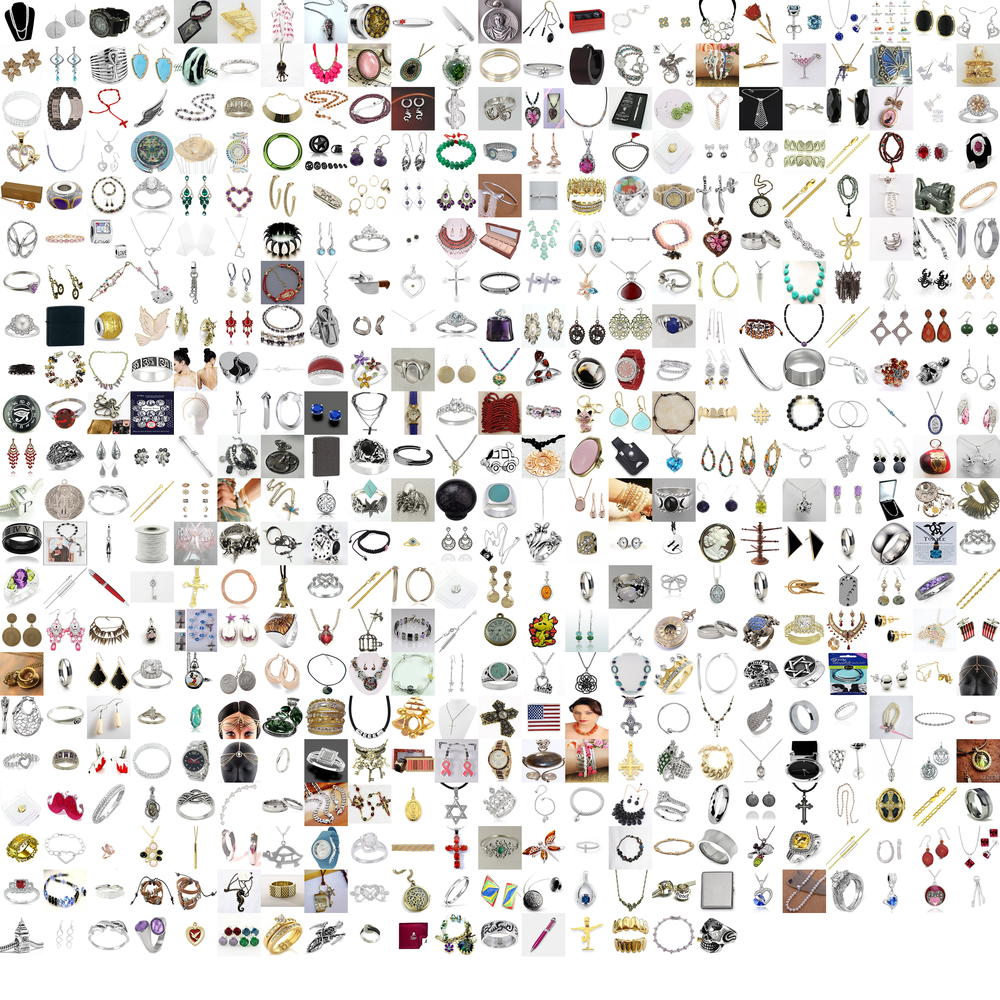

In [120]:
amazon_products.image_utils.column_to_sprites(
    df[df['product_category'] == 'C']['image_file'],
    image_directory=image_dir,
    n_samples=500,
    random_state=13,
    n_jobs=-1)

In [9]:
from amazon_products import resnet

vec = resnet.ResNetVectorizer(
    batch_size=500, 
    use_cache=True, 
    image_dir=image_dir, 
    cache_dir='resnet50_meansub')
features = vec.fit_transform(image_list[:100])

In [10]:
features

array([[  0.00000000e+00,   0.00000000e+00,   8.81058804e-04, ...,
          1.45113885e+00,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   7.27784857e-02, ...,
          1.71984923e+00,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   2.87050940e-02, ...,
          1.72399867e+00,   0.00000000e+00,   0.00000000e+00],
       ..., 
       [  0.00000000e+00,   0.00000000e+00,   2.30692942e-02, ...,
          1.68368471e+00,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
          1.48866618e+00,   0.00000000e+00,   0.00000000e+00],
       [  0.00000000e+00,   0.00000000e+00,   7.32003432e-03, ...,
          1.57643580e+00,   0.00000000e+00,   0.00000000e+00]], dtype=float32)

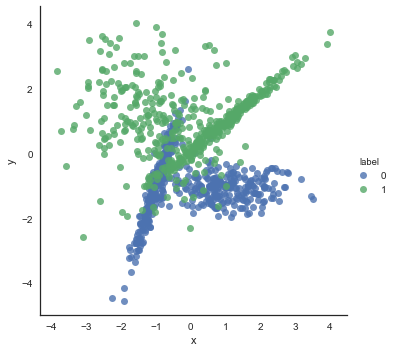

In [37]:
from sklearn import datasets
amazon_products.seaborn_utils
sns.set_style('white')

X, y = datasets.make_classification(n_samples=1000, 
                                    n_features=2, 
                                    n_redundant=0, 
                                    n_clusters_per_class=2, 
                                    random_state=42)
df = pd.DataFrame({'x': X[:, 0], 'y': X[:, 1], 'label': y})

g = sns.lmplot('x', 'y', data=df, hue='label', fit_reg=False)
g.savefig('classification.png')

In [63]:
images = amazon_products.image_utils.load_from_directory(image_dir, n_samples=10, as_image=True)

In [64]:
images

[<PIL.Image.Image image mode=RGB size=128x128 at 0x114B40320>,
 <PIL.Image.Image image mode=RGB size=128x128 at 0x114B40390>,
 <PIL.Image.Image image mode=RGB size=128x128 at 0x114B401D0>,
 <PIL.Image.Image image mode=RGB size=128x128 at 0x114B402E8>,
 <PIL.Image.Image image mode=RGB size=128x128 at 0x114A549B0>,
 <PIL.Image.Image image mode=RGB size=128x128 at 0x114A540F0>,
 <PIL.Image.Image image mode=RGB size=128x128 at 0x114A541D0>,
 <PIL.Image.Image image mode=RGB size=128x128 at 0x114A54A58>,
 <PIL.Image.Image image mode=RGB size=128x128 at 0x114A54E80>,
 <PIL.Image.Image image mode=RGB size=128x128 at 0x114A54048>]

In [48]:
image_iter = iter(images)

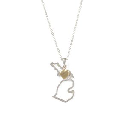

In [53]:
next(image_iter)